<a href="https://colab.research.google.com/github/indremontvilaite/class_b_lidaris/blob/main/Lidaris01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!ls

drive  sample_data


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [1]:
from pycocotools.coco import COCO

In [ ]:
!pip install git+https://github.com/fastai/fastai -qq

     |████████████████████████████████| 61kB 5.4MB/s 
     |████████████████████████████████| 12.8MB 11.3MB/s 
     |████████████████████████████████| 776.8MB 22kB/s 
ERROR: torchtext 0.9.1 has requirement torch==1.8.1, but you'll have torch 1.7.1 which is incompatible.


In [ ]:
!pip install nbdev -qq

     |████████████████████████████████| 51kB 4.3MB/s 
     |████████████████████████████████| 51kB 4.8MB/s 


In [ ]:
from fastai.vision.all import *
from nbdev.showdoc import *

In [17]:
import numpy as np
import os
import PIL
from PIL import Image
from numpy import asarray
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import array_to_img
from pycocotools.coco import COCO
import numpy as np
import skimage.io as io
import random
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
%matplotlib inline

In [16]:
%cd '/content/drive/MyDrive/Data/Lidaris'

/content/drive/MyDrive/Data/Lidaris


In [ ]:
path = '/content/drive/MyDrive/Data/Lidaris'

In [ ]:
# !unzip '/content/drive/MyDrive/Data/Lidaris/S002152_T002998.zip'

In [ ]:
#photo with damage
img_before_d = Image.open('S002152_T002998/Photos/10x_before/site10.jpg')
img_after_d = Image.open('S002152_T002998/Photos/10x_after/site10.jpg')
np_before_d = asarray(img_before_d)
np_after_d = asarray(img_after_d) 

In [ ]:
#photo without damage
img_before = Image.open('S002152_T002998/Photos/10x_before/site5.jpg')
img_after = Image.open('S002152_T002998/Photos/10x_after/site5.jpg')
np_before = asarray(img_before)
np_after = asarray(img_after) 

In [ ]:
print(numpydata.shape)
pilImage = Image.fromarray(np_before)
print(type(pilImage))
print(pilImage.mode)
print(pilImage.size)

(1944, 2592, 3)
<class 'PIL.Image.Image'>
RGB
(2592, 1944)


In [ ]:
np_label_d = np.subtract(np_after_d, np_before_d)
np.unique(np_label_d)
np_label = np.subtract(np_after, np_before)
#np_label

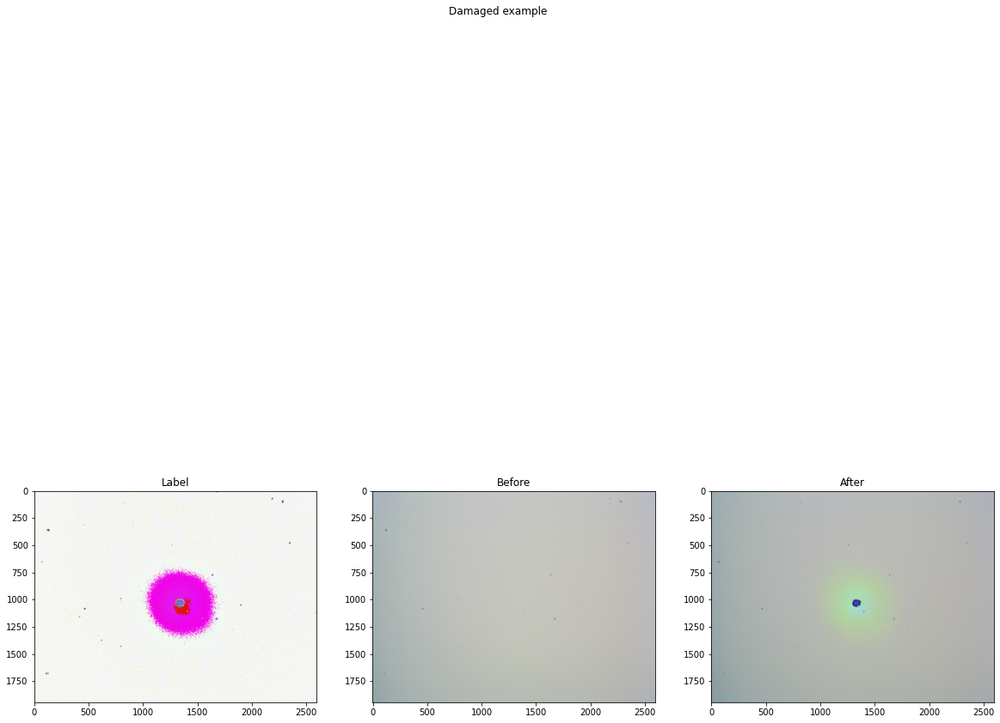

In [ ]:
plt.figure(figsize=(20, 20))

ax = plt.subplot(1, 3, 1)
plt.imshow(np_label_d)
plt.title('Label')
ax = plt.subplot(1, 3, 2)
plt.imshow(np_before_d)
plt.title('Before')
ax = plt.subplot(1, 3, 3)
plt.imshow(np_after_d)
plt.title('After')

plt.suptitle('Damaged example')
plt.show()

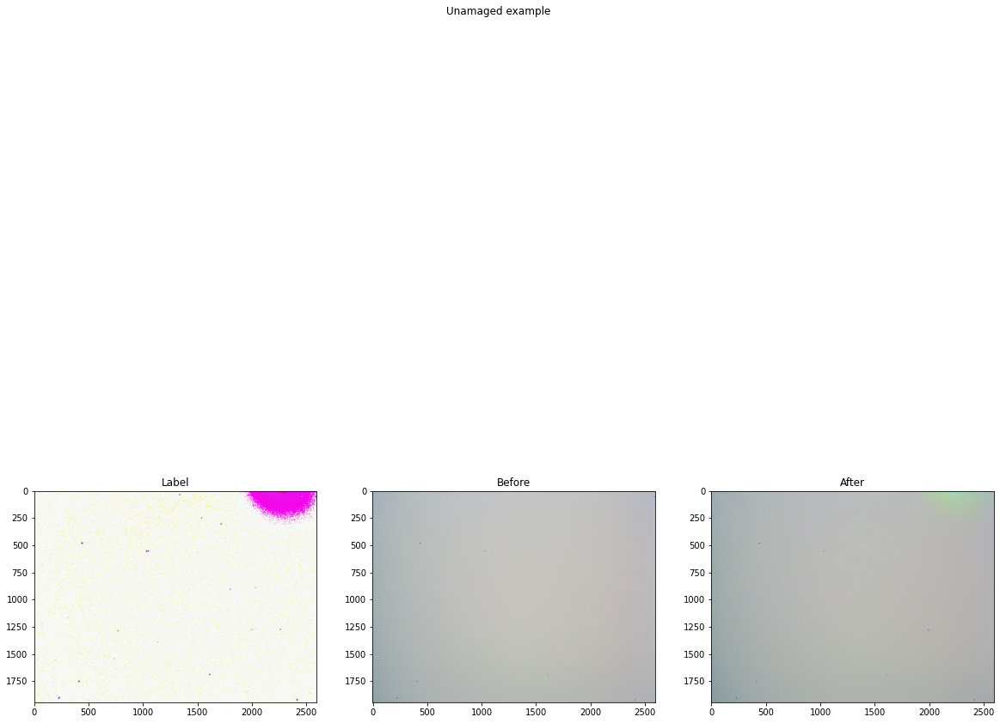

In [ ]:
plt.figure(figsize=(20, 20))

ax = plt.subplot(1, 3, 1)
plt.imshow(np_label)
plt.title('Label')
ax = plt.subplot(1, 3, 2)
plt.imshow(np_before)
plt.title('Before')
ax = plt.subplot(1, 3, 3)
plt.imshow(np_after)
plt.title('After')

plt.suptitle('Unamaged example')
plt.show()

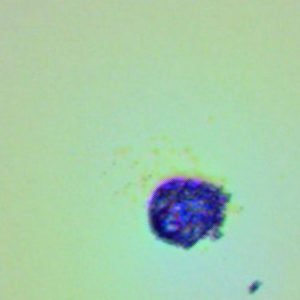

In [ ]:
array_to_img(np_after_d).crop((2592/2-150, 1944/2-150, 2592/2+150, 1944/2+150,))

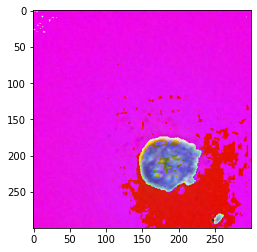

In [ ]:
row0 = int(1944/2-150)
row1 = int(1944/2+150)
column0 = int(2592/2-150)
column1 = int(2592/2+150)

plt.imshow(np_label_d[row0:row1, column0:column1, :])

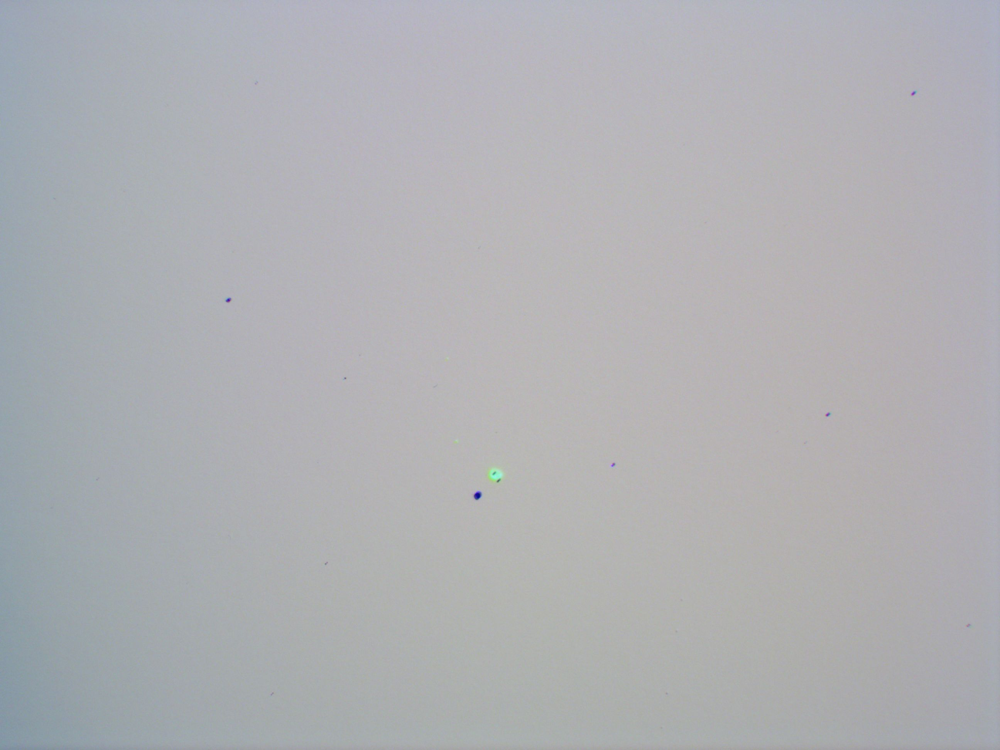

In [ ]:
#photo with damage
globals() 
i = 36
img_before_i = Image.open(f'S002152_T002998/Photos/10x_before/site{i}.jpg')
img_after_i = Image.open(f'S002152_T002998/Photos/10x_after/site{i}.jpg')
np_before_i = asarray(img_before_i)
np_after_i = asarray(img_after_i) 
np_label_i = np.subtract(np_after_i, np_before_i)

img_after_i

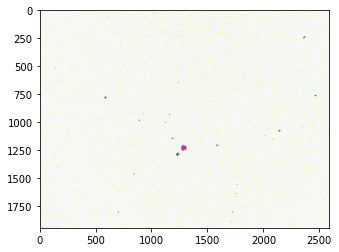

In [ ]:
plt.imshow(np_label_i)

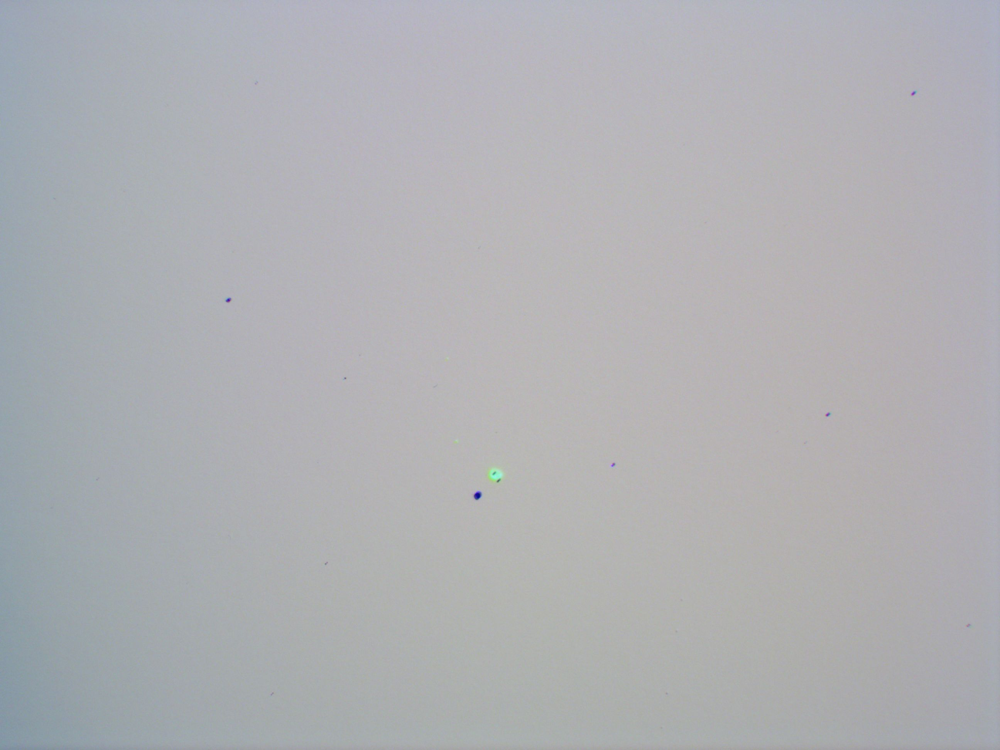

In [ ]:
fname_after = 'S002152_T002998/Photos/10x_after/site36.jpg'
pic_after = PIL.Image.open(str(fname_after))
pic_after

In [ ]:
ds_tensor= image_dataset_from_directory(
    'S002152_T002998/Photos',
    labels='inferred',
    image_size=[1944, 2592],
    interpolation='nearest',
)

Found 842 files belonging to 2 classes.


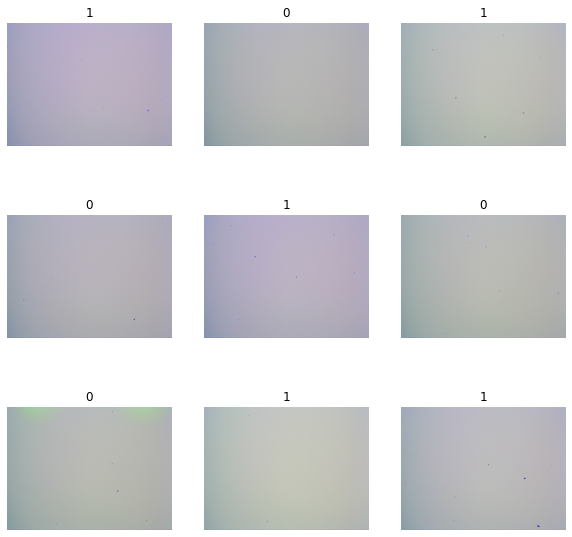

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in ds_tensor.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(int(labels[i]))
        plt.axis("off")

# COCO dataset

In [ ]:
import IPython
import os
import json
import random
import numpy as np
import requests
from io import BytesIO
import base64
from math import trunc
from PIL import Image as PILImage
from PIL import ImageDraw as PILImageDraw

In [ ]:
class CocoDataset():
    def __init__(self, annotation_path, image_dir):
        self.annotation_path = annotation_path
        self.image_dir = image_dir
        self.colors = colors = ['blue', 'purple', 'red', 'green', 'orange', 'salmon', 'pink', 'gold',
                                'orchid', 'slateblue', 'limegreen', 'seagreen', 'darkgreen', 'olive',
                               'teal', 'aquamarine', 'steelblue', 'powderblue', 'dodgerblue', 'navy',
                               'magenta', 'sienna', 'maroon']
        
        json_file = open(self.annotation_path)
        self.coco = json.load(json_file)
        json_file.close()
        
        self.process_info()
        #self.process_licenses()
        self.process_categories()
        self.process_images()
        self.process_segmentations()
            
        
    def display_info(self):
        print('Dataset Info:')
        print('=============')
        for key, item in self.info.items():
            print('  {}: {}'.format(key, item))
        
        requirements = [['description', str],
                        ['url', str],
                        ['version', str],
                        ['year', int],
                        ['contributor', str],
                        ['date_created', str]]
        for req, req_type in requirements:
            if req not in self.info:
                print('ERROR: {} is missing'.format(req))
            elif type(self.info[req]) != req_type:
                print('ERROR: {} should be type {}'.format(req, str(req_type)))
        print('')

        
    # def display_licenses(self):
    #     print('Licenses:')
    #     print('=========')
        
    #     requirements = [['id', int],
    #                     ['url', str],
    #                     ['name', str]]
    #     for license in self.licenses:
    #         for key, item in license.items():
    #             print('  {}: {}'.format(key, item))
    #         for req, req_type in requirements:
    #             if req not in license:
    #                 print('ERROR: {} is missing'.format(req))
    #             elif type(license[req]) != req_type:
    #                 print('ERROR: {} should be type {}'.format(req, str(req_type)))
    #         print('')
    #     print('')
        
    def display_categories(self):
        print('Categories:')
        print('=========')
        for cat_id in self.categories:
            print('    id {}: {}'.format(cat_id, self.categories[cat_id]['name']))
        print('')
    
    def display_image(self, image_id, show_polys=True, show_bbox=True, show_crowds=True, use_url=False):
        print('Image:')
        print('======')
        if image_id == 'random':
            image_id = random.choice(list(self.images.keys()))
        
        # Print the image info
        image = self.images[image_id]
        for key, val in image.items():
            print('  {}: {}'.format(key, val))
            
        # Open the image
        if use_url:
            image_path = image['coco_url']
            response = requests.get(image_path)
            image = PILImage.open(BytesIO(response.content))
            
        else:
            image_path = os.path.join(self.image_dir, image['file_name'])
            image = PILImage.open(image_path)
            
            buffer = BytesIO()
            image.save(buffer, format='PNG')
            buffer.seek(0)
            
            data_uri = base64.b64encode(buffer.read()).decode('ascii')
            image_path = "data:image/png;base64,{0}".format(data_uri)
            
        # Calculate the size and adjusted display size
        max_width = 600
        image_width, image_height = image.size
        adjusted_width = min(image_width, max_width)
        adjusted_ratio = adjusted_width / image_width
        adjusted_height = adjusted_ratio * image_height
        
        # Create list of polygons to be drawn
        polygons = {}
        bbox_polygons = {}
        rle_regions = {}
        poly_colors = {}
        print('  segmentations ({}):'.format(len(self.segmentations[image_id])))
        for i, segm in enumerate(self.segmentations[image_id]):
            polygons_list = []
            if segm['iscrowd'] != 0:
                # Gotta decode the RLE
                px = 0
                x, y = 0, 0
                rle_list = []
                for j, counts in enumerate(segm['segmentation']['counts']):
                    if j % 2 == 0:
                        # Empty pixels
                        px += counts
                    else:
                        # Need to draw on these pixels, since we are drawing in vector form,
                        # we need to draw horizontal lines on the image
                        x_start = trunc(trunc(px / image_height) * adjusted_ratio)
                        y_start = trunc(px % image_height * adjusted_ratio)
                        px += counts
                        x_end = trunc(trunc(px / image_height) * adjusted_ratio)
                        y_end = trunc(px % image_height * adjusted_ratio)
                        if x_end == x_start:
                            # This is only on one line
                            rle_list.append({'x': x_start, 'y': y_start, 'width': 1 , 'height': (y_end - y_start)})
                        if x_end > x_start:
                            # This spans more than one line
                            # Insert top line first
                            rle_list.append({'x': x_start, 'y': y_start, 'width': 1, 'height': (image_height - y_start)})
                            
                            # Insert middle lines if needed
                            lines_spanned = x_end - x_start + 1 # total number of lines spanned
                            full_lines_to_insert = lines_spanned - 2
                            if full_lines_to_insert > 0:
                                full_lines_to_insert = trunc(full_lines_to_insert * adjusted_ratio)
                                rle_list.append({'x': (x_start + 1), 'y': 0, 'width': full_lines_to_insert, 'height': image_height})
                                
                            # Insert bottom line
                            rle_list.append({'x': x_end, 'y': 0, 'width': 1, 'height': y_end})
                if len(rle_list) > 0:
                    rle_regions[segm['id']] = rle_list  
            else:
                # Add the polygon segmentation
                for segmentation_points in segm['segmentation']:
                    segmentation_points = np.multiply(segmentation_points, adjusted_ratio).astype(int)
                    polygons_list.append(str(segmentation_points).lstrip('[').rstrip(']'))
            polygons[segm['id']] = polygons_list
            if i < len(self.colors):
                poly_colors[segm['id']] = self.colors[i]
            else:
                poly_colors[segm['id']] = 'white'
            
            bbox = segm['bbox']
            bbox_points = [bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1],
                           bbox[0] + bbox[2], bbox[1] + bbox[3], bbox[0], bbox[1] + bbox[3],
                           bbox[0], bbox[1]]
            bbox_points = np.multiply(bbox_points, adjusted_ratio).astype(int)
            bbox_polygons[segm['id']] = str(bbox_points).lstrip('[').rstrip(']')
            
            # Print details
            print('    {}:{}:{}'.format(segm['id'], poly_colors[segm['id']], self.categories[segm['category_id']]))
        
        
        
        # Draw segmentation polygons on image
        html  = '<div class="container" style="position:relative;">'
        html += '<img src="{}" style="position:relative;top:0px;left:0px;width:{}px;">'.format(image_path, adjusted_width)
        html += '<div class="svgclass"><svg width="{}" height="{}">'.format(adjusted_width, adjusted_height)
        
        if show_polys:
            for seg_id, points_list in polygons.items():
                fill_color = poly_colors[seg_id]
                stroke_color = poly_colors[seg_id]
                for points in points_list:
                    html += '<polygon points="{}" style="fill:{}; stroke:{}; stroke-width:1; fill-opacity:0.5" />'.format(points, fill_color, stroke_color)
        
        if show_crowds:
            for seg_id, rect_list in rle_regions.items():
                fill_color = poly_colors[seg_id]
                stroke_color = poly_colors[seg_id]
                for rect_def in rect_list:
                    x, y = rect_def['x'], rect_def['y']
                    w, h = rect_def['width'], rect_def['height']
                    html += '<rect x="{}" y="{}" width="{}" height="{}" style="fill:{}; stroke:{}; stroke-width:1; fill-opacity:0.5; stroke-opacity:0.5" />'.format(x, y, w, h, fill_color, stroke_color)
            
        if show_bbox:
            for seg_id, points in bbox_polygons.items():
                fill_color = poly_colors[seg_id]
                stroke_color = poly_colors[seg_id]
                html += '<polygon points="{}" style="fill:{}; stroke:{}; stroke-width:1; fill-opacity:0" />'.format(points, fill_color, stroke_color)
                
        html += '</svg></div>'
        html += '</div>'
        html += '<style>'
        html += '.svgclass { position:absolute; top:0px; left:0px;}'
        html += '</style>'
        return html
       
    def process_info(self):
        self.info = self.coco['info']
    
    # def process_licenses(self):
    #     self.licenses = self.coco['licenses']
    
    def process_categories(self):
        self.categories = {}
        for category in self.coco['categories']:
            cat_id = category['id']
            
            # Add category to the categories dict
            if cat_id not in self.categories:
                self.categories[cat_id] = category
            else:
                print("ERROR: Skipping duplicate category id: {}".format(category))

    def process_images(self):
        self.images = {}
        for image in self.coco['images']:
            image_id = image['id']
            if image_id in self.images:
                print("ERROR: Skipping duplicate image id: {}".format(image))
            else:
                self.images[image_id] = image
                
    def process_segmentations(self):
        self.segmentations = {}
        for segmentation in self.coco['annotations']:
            image_id = segmentation['image_id']
            if image_id not in self.segmentations:
                self.segmentations[image_id] = []
            self.segmentations[image_id].append(segmentation)

In [ ]:
annotation_path = '/content/drive/MyDrive/Data/Lidaris/S002152_T002998/Photos/10x_after/annotations_coco.json'
image_dir = '/content/drive/MyDrive/Data/Lidaris/S002152_T002998/Photos/10x_after'

coco_dataset = CocoDataset(annotation_path, image_dir)

coco_dataset.display_categories()

Categories:
    id 1: 0
    id 2: 1



Image:
  id: 7
  width: 2592
  height: 1944
  file_name: site67.jpg
  segmentations (1):
    6:blue:{'id': 2, 'name': '1'}



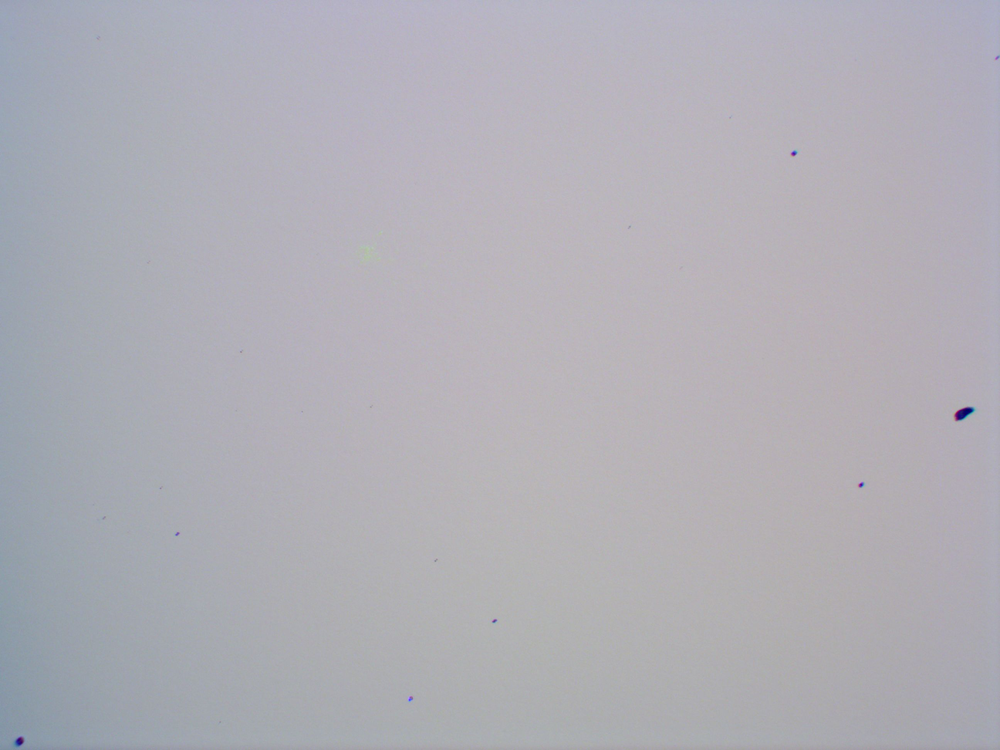

In [ ]:
ann_7 = coco_dataset.display_image(7, use_url=False)
IPython.display.HTML(ann_7)

# Mask

In [4]:
annotation_path = '/content/drive/MyDrive/Data/Lidaris/S002152_T002998/Photos/10x_after/annotations_coco.json'
image_dir = '/content/drive/MyDrive/Data/Lidaris/S002152_T002998/Photos/10x_after'
# Initialize the COCO api for instance annotations
coco=COCO(annotation_path)

# Load the categories in a variable
catIDs = coco.getCatIds()
cats = coco.loadCats(catIDs)

print(cats)

loading annotations into memory...
Done (t=4.47s)
creating index...
index created!
[{'id': 1, 'name': '0'}, {'id': 2, 'name': '1'}]


In [10]:
imgIds

[]

Number of images containing damages: 91


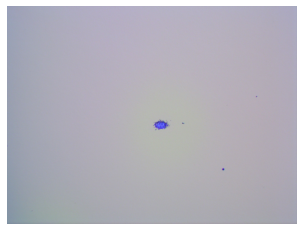

In [19]:
filterClasses = ['0', '1']

# Fetch class IDs only corresponding to the filterClasses
catIds = coco.getCatIds(catNms=filterClasses) 
# Get all images containing the above Category IDs
imgIds = coco.getImgIds()
print("Number of images containing damages:", len(imgIds))

# load and display a random image
img = coco.loadImgs(imgIds[np.random.randint(0,len(imgIds))])[0]
I = io.imread('{}/{}'.format(image_dir,img['file_name']))/255.0

plt.axis('off')
plt.imshow(I)
plt.show()

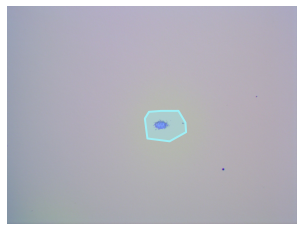

In [21]:
plt.imshow(I)
plt.axis('off')
annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds, iscrowd=None)
anns = coco.loadAnns(annIds)
coco.showAnns(anns)

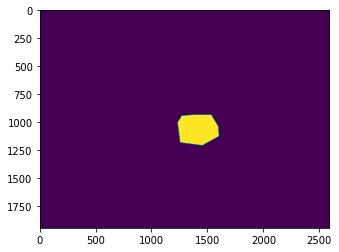

In [22]:
mask = np.zeros((img['height'],img['width']))
for i in range(len(anns)):
    mask = np.maximum(coco.annToMask(anns[i]), mask)
plt.imshow(mask)

In [23]:
anns

[{'area': 83112.25742451484,
  'bbox': [1230.2362204724404,
   934.0157480314957,
   368.5039370078739,
   272.12598425196836],
  'category_id': 2,
  'id': 66,
  'image_id': 65,
  'iscrowd': 0,
  'segmentation': [[1230.2362204724404,
    1002.0472440944878,
    1252.9133858267712,
    1180.6299212598421,
    1451.3385826771648,
    1206.141732283464,
    1598.7401574803143,
    1123.9370078740153,
    1593.0708661417318,
    1038.8976377952752,
    1530.7086614173222,
    934.0157480314957,
    1374.8031496062988,
    934.0157480314957,
    1267.0866141732279,
    942.5196850393697]]}]